<a href="https://colab.research.google.com/github/dbrody112/An-Automatic-Thresholding-Algorithm-for-Cloud-Masks/blob/main/toy_dataset_convex_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Installations and Dependencies**

In [ ]:

!apt-get update
!apt-get install libgdal-dev -y
!apt-get install python-gdal -y
!apt-get install python-numpy python-scipy -y
!pip install rasterio
!pip install rioxarray
!pip install geemap
!pip install geojson
!pip install geopandas

Get:1 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:5 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [83.3 kB]
Get:6 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:8 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:9 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:10 http://security.ubuntu.com/ubuntu bionic-security/main amd64 Packages [3,040 kB]
Get:11 http://security.ubuntu.com/ubuntu bionic-security/universe amd64 Packages [1,554 kB]
Ign:12 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:13 http://archive.ubuntu.com/ubuntu bionic-

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 4.7 MB/s 
     |████████████████████████████████| 16.7 MB 40.7 MB/s 


# **Aligning Dataset**

In [ ]:

import matplotlib.pyplot as plt
import rioxarray as rxr
import rasterio
from rasterio.crs import CRS
import glob
import subprocess
import urllib, geojson,subprocess,gdal
import geopandas as gpd
import shapefile
import os
import ee
import json
import numpy as np
import pandas as pd
import geemap
from rasterio.plot import show
import math
import osr

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
''' gis_projects is where the original dataset and geojson are stored'''
'''in order to align you have to create a few folders in your drive. create folders with these names:

- revised_dataset_projected
- revised_dataset_resolution
- new_dataset

'''

'in order to align you have to create a few folders in your drive. create folders with these names:\n\n- revised_dataset_projected\n- revised_dataset_resolution\n- new_dataset\n\n'

In [ ]:
geojson_loc = '/content/drive/MyDrive/gis_projects/santafe_crop.geojson'
dataset_loc = '/content/drive/MyDrive/gis_projects'
projected_dataset_loc = '/content/drive/MyDrive/revised_dataset_projected'
resolution_dataset_loc = '/content/drive/MyDrive/revised_dataset_resolution'


# Summary

For the first step in aligning the dataset I reprojected files in dataset to EPSG:32316 because this is a UTM CRS, which was recommended by the professor, but also because this projection was found in the dataset so it appears that the coordinate system is native to the images. After that, I changed the resolution of each image to 20m, since this was the maximum, such that no data will be lost. e.g. if an image at 20m was changed to a resolution of 10m the data may be lost. Additionally, I changed the resolution to this value such that less RAM is used in calulations involnving the dataset. The next step was then to convert the geojson to a shapefile with the CRS specified (EPSG:32613) and crop to cutline

In [ ]:
#for loop to create a copy and paste script for command line to reproject files to utm (epsg:32613)

i = 0
for name in glob.glob(dataset_loc+'/*.tif'):
    print('gdalwarp -t_srs EPSG:32613' + " " +name+" " +projected_dataset_loc+'/i'+os.path.basename(name)[:-4]+str(i)+'utm'+'.tif')
    i+=1

#NOTE: Unfortunately I have been trying for about 10 hours in total to resolve issues with gdalwarp to no avail.
#The only way that I was able to reproject the dataset was to use the command line via colab pro.
#My drive is mounted so feel free to use those files or run all other portions of this code. They should work.
#Another option could be to skip the aligning dataset portion and use the new_dataset I have stored in my drive.


gdalwarp -t_srs EPSG:32613 /content/drive/MyDrive/gis_projects/sentinel-2_L1C_2018-01-07.tif /content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-01-070utm.tif
gdalwarp -t_srs EPSG:32613 /content/drive/MyDrive/gis_projects/sentinel-2_L1C_2018-01-12.tif /content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-01-121utm.tif
gdalwarp -t_srs EPSG:32613 /content/drive/MyDrive/gis_projects/sentinel-2_L1C_2018-01-14.tif /content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-01-142utm.tif
gdalwarp -t_srs EPSG:32613 /content/drive/MyDrive/gis_projects/sentinel-2_L1C_2018-01-27.tif /content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-01-273utm.tif
gdalwarp -t_srs EPSG:32613 /content/drive/MyDrive/gis_projects/sentinel-2_L1C_2018-01-29.tif /content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-01-294utm.tif
gdalwarp -t_srs EPSG:32613 /content/drive/MyDrive/gis_projects/sentinel-2_L1C_2018-02-08.tif /content/drive/MyDrive

In [ ]:
'''finding crs for the files projected to utm (as a check)'''

for name in glob.glob(projected_dataset_loc+'/*.tif'):
    dem = rxr.open_rasterio(name,masked=True).squeeze()
    print(name, dem.rio.crs)

/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-06-2843utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-0144utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-0345utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-0646utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-0847utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-1148utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-1349utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-1650utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-1851utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_projected/isentinel-2_L1C_2018-07-2152utm.tif EPSG:32613
/content/drive/MyDrive/revised_dataset_p

In [ ]:
'''resolution exploration'''

#getting affine transform of tif
#upx is upper pixel x
#xes is pixel width
#xkew is shear in x direction
summation = 0
length = 0
maximum = 0
for name in glob.glob(projected_dataset_loc+'/*.tif'):
    ds = gdal.Open(name)
    upx, xres, xskew, upy, yskew, yres = ds.GetGeoTransform()
    print('the resolution of ' + os.path.basename(name) + " (" + str(xres) + ","+str(yres)+")." )
    if(xres>maximum):
        maximum = xres
print(" ")
print("the max resolution is " + str(maximum))

the resolution of isentinel-2_L1C_2018-06-2843utm.tif (8.989687318362286,-8.989687318362286).
the resolution of isentinel-2_L1C_2018-07-0144utm.tif (13.907987213254179,-13.907987213254179).
the resolution of isentinel-2_L1C_2018-07-0345utm.tif (8.372483650487265,-8.372483650487265).
the resolution of isentinel-2_L1C_2018-07-0646utm.tif (10.094781256680749,-10.094781256680749).
the resolution of isentinel-2_L1C_2018-07-0847utm.tif (18.125666604380786,-18.125666604380786).
the resolution of isentinel-2_L1C_2018-07-1148utm.tif (18.766937656360348,-18.766937656360348).
the resolution of isentinel-2_L1C_2018-07-1349utm.tif (13.690449373183032,-13.690449373183032).
the resolution of isentinel-2_L1C_2018-07-1650utm.tif (11.790265347237545,-11.790265347237545).
the resolution of isentinel-2_L1C_2018-07-1851utm.tif (8.744960573480064,-8.744960573480064).
the resolution of isentinel-2_L1C_2018-07-2152utm.tif (12.058825131544097,-12.058825131544097).
the resolution of isentinel-2_L1C_2018-07-2353

In [ ]:
'''changing resolution of all reprojected images to max resolution (downsampling will ruin features)'''

i = 0
for name in glob.glob(projected_dataset_loc+'/*.tif'):
    args = ['gdal_translate','-of','GTiff','-tr',str(maximum),str(maximum),name,resolution_dataset_loc+'/i'+os.path.basename(name)[:-4]+str(i)+'res'+'.tif']
    subprocess.Popen(args)
    i+=1

In [ ]:
'''creating dataset of original names'''

names = []
for name in glob.glob(dataset_loc+'/*.tif'):
    names.append(os.path.basename(name))

In [ ]:
'''creating shapefile out of geojson and projecting it to epsg:32613'''

'creating shapefile out of geojson and projecting it to epsg:32613'

In [ ]:
!ogr2ogr /content/drive/MyDrive/gis_projects/output.shp -t_srs 'http://spatialreference.org/ref/epsg/32613/' /content/drive/MyDrive/gis_projects/santafe_crop.geojson

In [ ]:
'''cropping images to shapefile extent and changing name back to original'''

i = 0
for name in glob.glob(resolution_dataset_loc+'/*.tif'):
    print(name)
    args = ['gdalwarp','-cutline','/content/drive/MyDrive/gis_projects/output.shp','-crop_to_cutline','-dstalpha',name,'/content/drive/MyDrive/new_dataset/i'+names[i]]
    subprocess.Popen(args)
    i+=1

/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-07-0144utm1res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-12-20100utm57res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-07-0847utm4res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-07-1148utm5res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-08-0558utm15res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-07-2855utm12res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C59res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-12-30101utm58res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-11-1388utm45res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-09-0967utm24res.tif
/content/drive/MyDrive/revised_dataset_resolution/iisentinel-2_L1C_2018-09-2975utm32res.tif
/cont

# **Analyzing Dataset**

In [ ]:
#band 4 is nir
#band 1 is red
#band 7 is alpha

#loading in data

#for each file, the data is opened and the image height, width, bands, 
# and alpha band measurement are loaded into a stack.

dataset_array = []

for name in glob.glob("/content/drive/MyDrive/new_dataset/*.tif"):

  data = rasterio.open(name)

  #normalizing alpha band just in case

  alpha_band = np.mean(data.read()[6]/np.max(data.read()[6]))
  
  dataset_array.append([data.height,data.width,data.read(),alpha_band])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


In [ ]:
data_array = np.stack(dataset_array)

/usr/local/lib/python3.7/dist-packages/numpy/core/shape_base.py:420: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arrays = [asanyarray(arr) for arr in arrays]


In [ ]:
''' finding the range of values for each respective band '''

#creating array of dataset bands (in hindsight it may have been easier to use a column index)

dataset_bands = data_array[:,2]
band_distribution = []

#separating each band

for i in range(len(dataset_bands)):
  band_distribution.append([dataset_bands[i][j] for j in range(7)])
band_distribution = np.array(band_distribution)

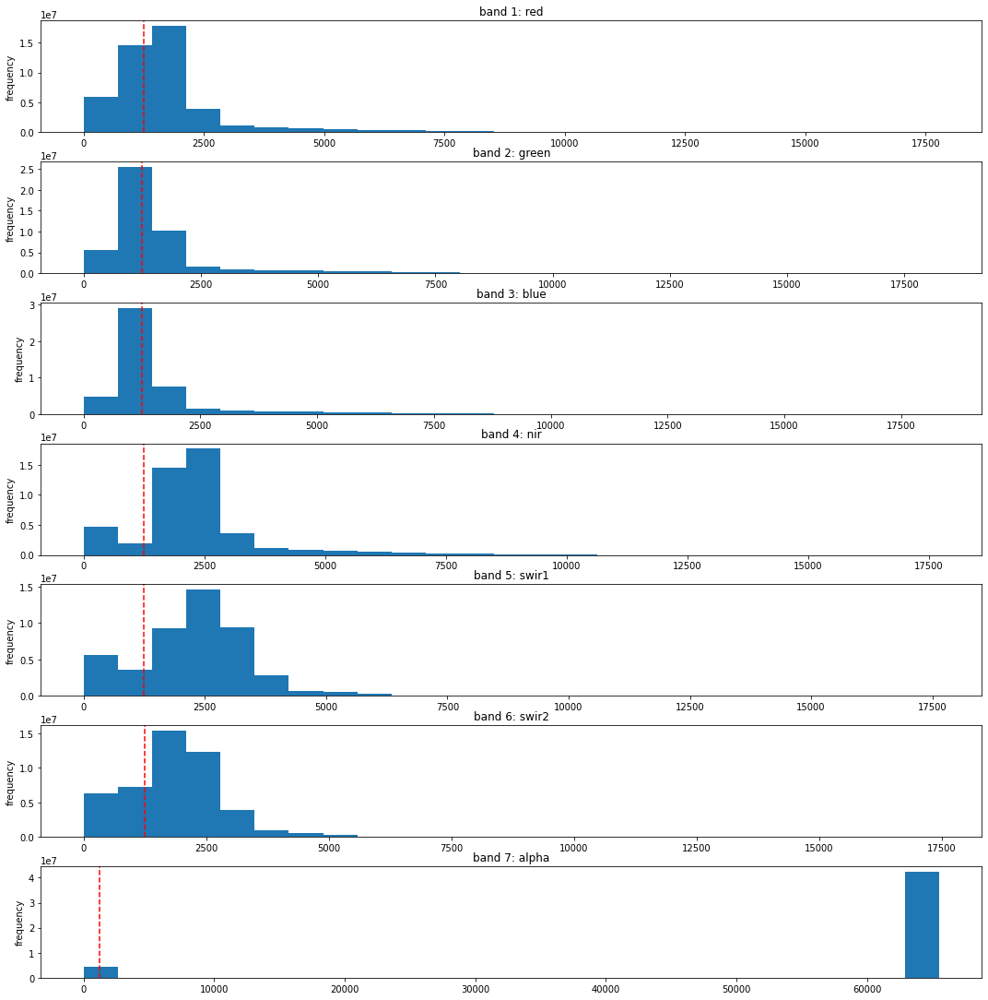

In [ ]:
'''creating histogram of values of images picked from aligned dataset'''

fig, axs = plt.subplots(7,1)

fig.set_figheight(15)
fig.set_figwidth(15)
fig.tight_layout()
bands = {0:'red',1:'green',2:'blue',3:'nir',4:'swir1',5:'swir2',6:'alpha'}
for i in range(7):
  axs[i].axvline(x = 1250, color = 'r', linestyle = "dashed")
  axs[i].hist(band_distribution[:,i].flatten().squeeze(),bins=25)
  
  axs[i].set_title("band " + str(i+1) + ": " + bands[i]) 
  axs[i].set_ylabel('frequency')
  


In [ ]:
'''computing cloud mask from hist'''

def create_cloud_mask(img_array):

  '''creating cloud mask from blue band (band 3) and swir band (band 5).
  blue band identifies dense clouds with high reflectance and 
  swir band differentiates snow from cloud because snow can have a high
  reflectance in blue band but low reflectance in swir1 band'''

  '''
  INPUTS:

  img_array (.tif as array): the .tif you want to apply a cloud mask on

  OUTPUTS:

  cloud_mask_matrix: matrix with zeros (invalid data) at the places where a cloud is predicted

  ''' 

  #thresholding based on histogram. It took some testing and educated guesses but these were the best values
  #using np.where to find the points where over threshold

  blue = np.where(img_array[2] >=1250)
  swir1 = np.where(img_array[4] >=3000) 

  #finding where the points intersect between those that surpass the swir1 and blue

  df_blue = pd.DataFrame({'blue':[(blue[0][i],blue[1][i]) for i in range(len(blue[0]))]})
  df_swir1 = pd.DataFrame({'swir1':[(swir1[0][i],swir1[1][i]) for i in range(len(swir1[0]))]}) 
  df_merged = df_blue.merge(df_swir1,left_on = 'blue',right_on ='swir1')

  #creating cloud mask matrix starting with an array of 1s (valid data), putting 0s where a cloud is predicted

  cloud_mask_matrix = np.ones((np.shape(img_array[2])[0], np.shape(img_array[2])[1])).astype('uint16')
  print(len(df_merged['blue']))
  for i in df_merged['blue']:
    arr = np.array(i)
    cloud_mask_matrix[arr[0]][arr[1]] = 0
  return cloud_mask_matrix

def create_cloud_arr(image_stack):
  ''' applying create_cloud_mask function'''

  '''
  INPUTS:
  
  image_stack: np.stack of .tifs as arrays where each array has a length of n, 
  the number of bands

  OUTPUTS:

  alpha_band_arr: updated alpha band with cloud mask added
  thresholded_points: number of points predicted to be part of the cloud from the cloud mask.

  '''

  alpha_band_arr = []
  num_thresholded_points = []
  for i in range(len(image_stack)):

    #creating cloud mask for an individual image

    cloud_mask = create_cloud_mask(image_stack[i])

    #finding the number of points predicted in the image as cloud

    num_thresholded_points.append(np.shape(cloud_mask)[0]*np.shape(cloud_mask)[1] - np.sum(cloud_mask))

    #final result

    alpha_band_arr.append(cloud_mask*image_stack[i][6].astype('bool').astype('uint16'))
  return alpha_band_arr,num_thresholded_points

In [ ]:
#creating cloud masks for each file and storing in an array

cloud_mask_arr, num_thresholded_points= create_cloud_arr(data_array[:,2])

481012
535138
257273
284933
264825
524010
231154
448501
403448
219639
436829
198533
380425
170530
370418
323718
158960
113537
331199
274179
160431
168154
105057
78369
55533
137222
64066
159654
78198
59214
147972
121885
115237
0
63134
473863
34925
28928
5241
89585
37650
831
678296
27475
20147
17805
575
20391
17196
45480
31605
8402
34504
734
90470
19663
134053
6
40366
6


In [ ]:


#This function, rescale_img, was specifically taken from Professor Karra from his lecture on Week 5.
#there is no link to go to but if you are in the Remote Sensing class you can find the function through Teams and/or Google Drive

def rescale_img(img, min_val=0.0, max_val=1.0, dtype=np.float32, pmin=0.0, pmax=100.0):
    vmin, vmax = np.nanpercentile(img, pmin), np.nanpercentile(img, pmax)

    
    img_rescale = ((img - vmin) * (1.0 / (vmax - vmin) * max_val)).astype(dtype)
    np.clip(img_rescale, min_val, max_val, out=img_rescale)

    return img_rescale

#helper function to shorthand rescale_img with specific parameters

image_rescaled = lambda x: rescale_img(x,pmin = 0.2,pmax = 99.8)


def show_image(picture_num,band):

  '''showing image with a comparison between original and cloud mask'''

  '''

  INPUTS:

  picture_num: (int) index of image stack loaded in (used to isolate individual images)
  band: (int) band of image to use e.g. band = 0 is the red band

  '''

  
  alpha_band = (data_array[:,2][picture_num][6].astype('bool')).astype('uint16')
  data_validation = cloud_mask_arr[picture_num]*alpha_band
  cloud_mask_picture = image_rescaled(data_array[:,2][picture_num][band]*(data_validation))
  orig_image = data_array[:,2][picture_num][band]*(alpha_band)

  fig, axs = plt.subplots(1,2)
  fig.set_figheight(15)
  fig.set_figwidth(15)

  fig.tight_layout()

  #plots image with cloud mask

  axs[0].imshow(cloud_mask_picture,cmap = 'cividis')
  axs[0].set_title('with cloud mask')

  #plots image without cloud mask

  axs[1].imshow(rescale_img(orig_image,pmin=0.2, pmax=99.8),cmap = 'cividis')
  axs[1].set_title('without cloud mask')

  return orig_image


#testing cloud mask

#show_image(picture_num =59, band = 2)

PART 1 FUNCTIONS

In [ ]:
def apply_cloud_mask(picture_num,band):

  ''' 
  applying cloud mask to picture num and band
  
  '''

  '''
  INPUTS:

  picture_num: (int) index of image stack loaded in (used to isolate individual images)
  band: (int) band of image to use e.g. band = 0 is the red band

  OUTPUTS:

  returns image band with applied cloud mask

  '''

  alpha_band = (data_array[:,2][picture_num][6].astype('bool')).astype('uint16')
  data_validation = cloud_mask_arr[picture_num]*alpha_band
  return data_array[:,2][picture_num][band]*data_validation





def calculate_greenest_scene(cloud_mask_arr,max_or_mean = 'mean'):

  '''calculates the image with the best ndvi based on the max or mean of the image, default mean.
  The image will have a cloud mask derived from the swir and blue band so that 
  invalid data will not be part of the mean. I personally defined greenest scene as the greatest mean(ndvi)
  because if we define only on max(NDVI) then there is a possibility that only a small portion of the image is green.
  I have it so that you can specify max or mean since people have different interpretations of greenest scene. Note:
  if you are worried about the cloud mask for the max option, it will have no effect. If a scene truly has an area where there is max NDVI, 
  it will not have a high reflectance in the swir and blue band and therefore not be invalid by the cloud mask.'''
  
  '''
  INPUTS:

  cloud_mask_arr : (array) array of cloud masks which can be made by using the create_cloud_arr function
  max_or_mean : (string) if this variable is equivalent to 'mean' it computes the mean. Elsewise it computes the max.

  OUTPUTS:

  greenest_scene_val: (int) the best NDVI based on whichever option chosen (max or mean)
  greenest_scene_picture_num: (int) the picture for which there is the best NDVI ased on whichever option chosen (max or mean)
  '''

  #computing ndvi for each image. There is an initial value of -10000 for NDVI and -1 for the picture number.
  #the picture number is just used as an index to isolate a specific image in the stack of images imported.
  #If an ndvi is greater than the last NDVI that was appended to maximum then it is appended as well as its corresponding picture number.
  #In this way the last entry of maximum includes the max ndvi and picture with max ndvi

  maximum = []
  maximum.append([-10000,-1])
  for i in range(len(cloud_mask_arr)):

    #getting bands for calculation

    red = data_array[:,2][i][0]
    nir = data_array[:,2][i][3]

    #calculating ndvi

    aggregated_ndvi = 0
    ndvi = ((nir-red)/(nir+red))
    if(max_or_mean == 'max'):
      aggregated_ndvi = np.nanmax(ndvi)
    else:
      aggregated_ndvi = np.nanmean(ndvi)
    
    #appending max ndvi if greater than last value of maximum

    if(aggregated_ndvi>maximum[len(maximum)-1][0]):
      maximum.append([aggregated_ndvi,i,ndvi])


  greenest_scene_val = maximum[len(maximum)-1][0]
  greenest_scene_picture_num = maximum[len(maximum)-1][1]
  return greenest_scene_val,greenest_scene_picture_num


#snow 

def calculate_snowiest_scene(cloud_mask_arr,max_or_mean = 'mean'):

  '''calculates the image with the best ndsi based on the max or mean of the image, default mean.
  The image will have a cloud mask derived from the swir and blue band so that 
  invalid data will not be part of the mean. I personally defined greenest scene as the greatest mean(ndsi)
  because if we define only on max(NDSI) then there is a possibility that only a small portion of the image is green.
  I have it so that you can specify max or mean since people have different interpretations of greenest scene. Note:
  if you are worried about the cloud mask for the max option, it should have no effect. If a scene truly has an area where there is max NDSI, 
  then it will have a low reflectance in the swir band and therefore not be invalid by the cloud mask.'''
  
  '''
  INPUTS:

  cloud_mask_arr : (array) array of cloud masks which can be made by using the create_cloud_arr function
  max_or_mean : (string) if this variable is equivalent to 'mean' it computes the mean. Elsewise it computes the max.

  OUTPUTS:

  snowiest_scene_val: (int) the best NDSI based on whichever option chosen (max or mean)
  snowiest_scene_picture_num: (int) the picture for which there is the best NDSI based on whichever option chosen (max or mean)
  '''

  #computing ndsi for each image. There is an initial value of -10000 for NDsI and -1 for the picture number.
  #the picture number is just used as an index to isolate a specific image in the stack of images imported.
  #If an ndsi is greater than the last NDsI that was appended to maximum then it is appended as well as its corresponding picture number.
  #In this way the last entry of maximum includes the max ndsi and picture with max ndsi

  maximum = []
  maximum.append([-10000,-1])
  for i in range(len(cloud_mask_arr)):

    #getting bands for calculation

    green = apply_cloud_mask(i,1)
    swir1 = apply_cloud_mask(i,4)

    #calculating ndsi

    aggregated_ndsi = 0
    ndsi = ((green-swir1)/(green+swir1))
    if(max_or_mean == 'max'):
      aggregated_ndsi = np.nanmax(ndsi)
    else:
      aggregated_ndsi = np.nanmean(ndsi)
    
    #appending max ndsi if greater than last value of maximum


    if(aggregated_ndsi>maximum[len(maximum)-1][0]):
      maximum.append([aggregated_ndsi,i,ndsi])


  snowiest_scene_val = maximum[len(maximum)-1][0]
  snowiest_scene_picture_num = maximum[len(maximum)-1][1]
  return snowiest_scene_val,snowiest_scene_picture_num


def calculate_max_brightness(cloud_mask_arr,max_or_mean = 'mean'):

  '''calculates the image with the best brightness based on the max or mean of the image, default mean.
   I personally defined greenest scene as the greatest mean(ndsi)
  because if we define only on max(brightness) then there is a possibility that only a small portion of the image is very bright.
  I have it so that you can specify max or mean since people have different interpretations of greenest scene.'''
  
  '''
  INPUTS:

  cloud_mask_arr : (array) array of cloud masks which can be made by using the create_cloud_arr function
  max_or_mean : (string) if this variable is equivalent to 'mean' it computes the mean. Elsewise it computes the max.

  OUTPUTS:

  snowiest_scene_val: (int) the best NDSI based on whichever option chosen (max or mean)
  snowiest_scene_picture_num: (int) the picture for which there is the best NDSI based on whichever option chosen (max or mean)
  '''

  maximum = []
  maximum.append([-10000,-1])
  for i in range(len(cloud_mask_arr)):
    
    red = data_array[:,2][i][0]
    green = data_array[:,2][i][1]
    blue = data_array[:,2][i][2]
    brightness = 0
    visible_light = (red+green+blue)/3
    if(max_or_mean == 'max'):
      brightness = np.nanmax(visible_light)
    else:
      brightness = np.nanmean(visible_light)
    
    if(brightness>maximum[len(maximum)-1][0]):
      maximum.append([brightness,i,visible_light])
  brightness_max = maximum[len(maximum)-1][0]
  max_brightness_picture_num = maximum[len(maximum)-1][1]
  return brightness_max,max_brightness_picture_num

GREENEST_SCENE

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:71: RuntimeWarning: Mean of empty slice


 
the picture with max ndvi is isentinel-2_L1C_2018-06-23.tif with 1.8260647429049974.
 


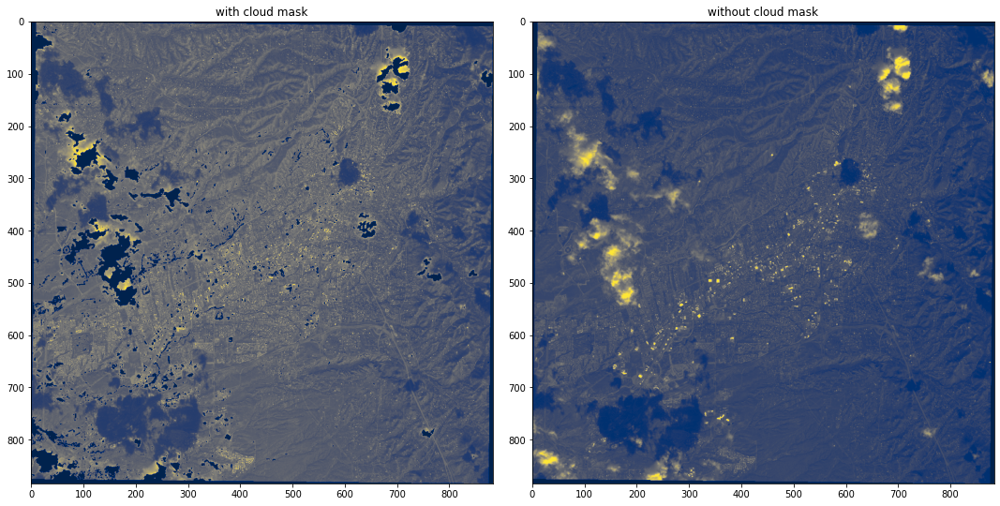

In [ ]:
arr = []
for name in glob.glob('/content/drive/MyDrive/new_dataset/*.tif'):
  arr.append(name)

greenest_scene_val,greenest_scene_picture_num = calculate_greenest_scene(cloud_mask_arr)
green_image = show_image(greenest_scene_picture_num, band = 1)
print(' ')
print(f'the picture with max ndvi is {os.path.basename(arr[greenest_scene_picture_num])} with {greenest_scene_val}.')
print(' ')

SNOWIEST_SCENE

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:125: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:129: RuntimeWarning: Mean of empty slice


 
the picture with max ndsi is isentinel-2_L1C_2018-07-16.tif with 22.346909291971453.
 


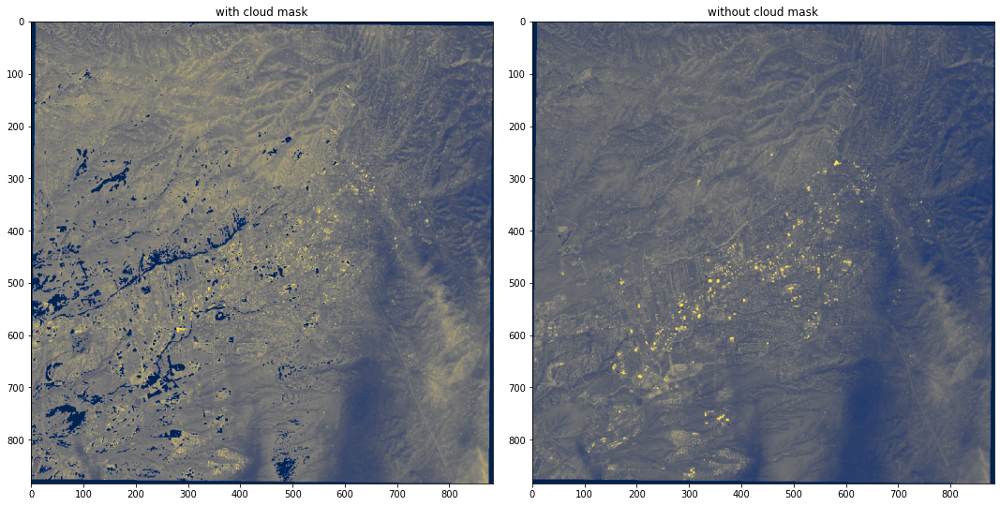

In [ ]:
snowiest_scene_val,snowiest_scene_picture_num= calculate_snowiest_scene(cloud_mask_arr)
snow_image = show_image(snowiest_scene_picture_num, band = 1)
print(' ')
print(f'the picture with max ndsi is {os.path.basename(arr[snowiest_scene_picture_num])} with {snowiest_scene_val}.')
print(' ')

CLOUDIEST_IMAGE

 
the cloudiest picture is isentinel-2_L1C_2018-06-26.tif with sum of 678296.
 


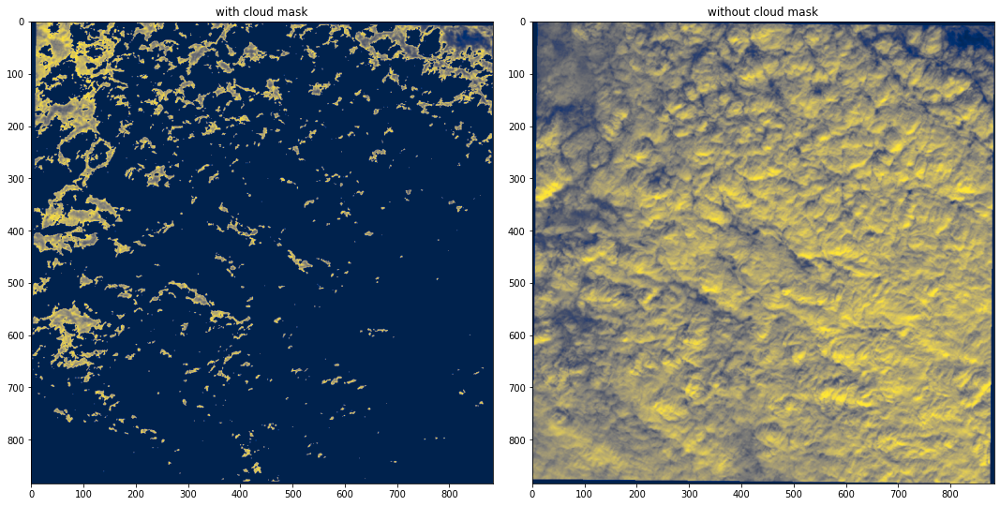

In [ ]:
cloudiest_image_index = np.where(num_thresholded_points == max(num_thresholded_points))[0][0]
cloudiest_image_value = num_thresholded_points[cloudiest_image_index]
cloudy_image = show_image(cloudiest_image_index, band = 4)
print(' ')
print(f'the cloudiest picture is {os.path.basename(arr[cloudiest_image_index])} with sum of {int(cloudiest_image_value)}.')
print(' ')

BRIGHTEST_IMAGE

 
the picture with max brightness is isentinel-2_L1C_2018-01-27.tif with 4773.544760037674.
 


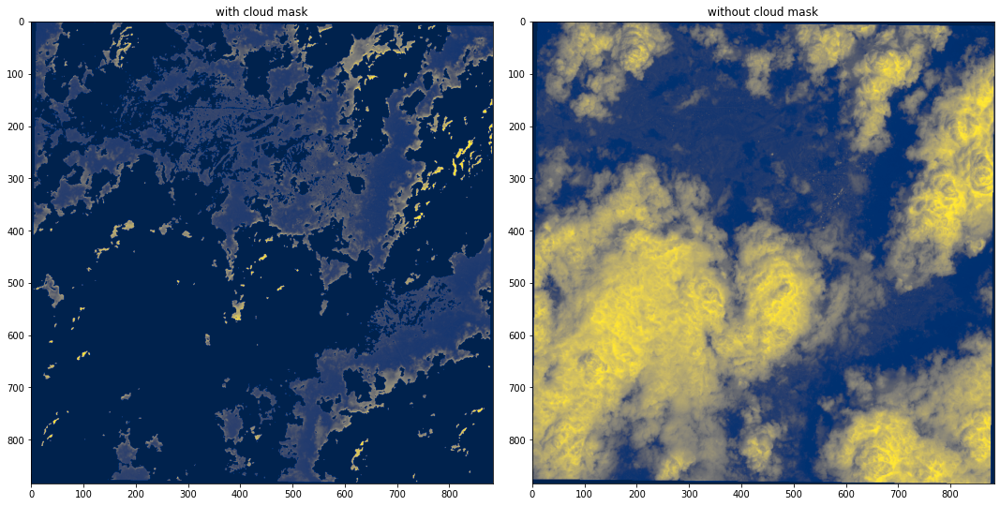

In [ ]:

brightness_max,max_brightness_picture_num = calculate_max_brightness(cloud_mask_arr)
show_image(max_brightness_picture_num, band = 2)
print(' ')
print(f'the picture with max brightness is {os.path.basename(arr[max_brightness_picture_num])} with {brightness_max}.')
print(' ')

Generating Toy *Dataset*

In [ ]:
#edit picture num to change image to do a 4x4 window

picture_num_used = cloudiest_image_index

reference = data_array[picture_num_used]

np.save('/content/drive/MyDrive/toy_dataset_reference', reference)

In [ ]:
np.shape(reference[2])

(7, 884, 884)

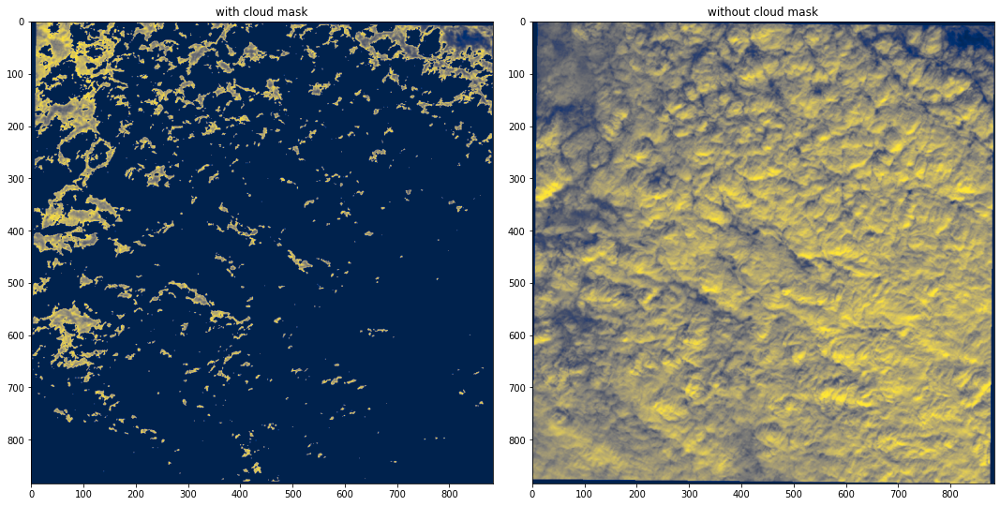

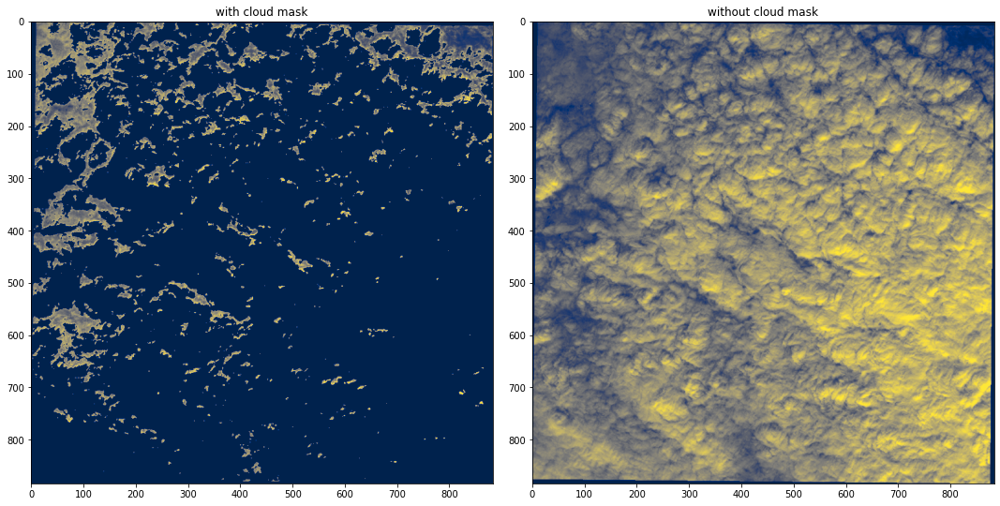

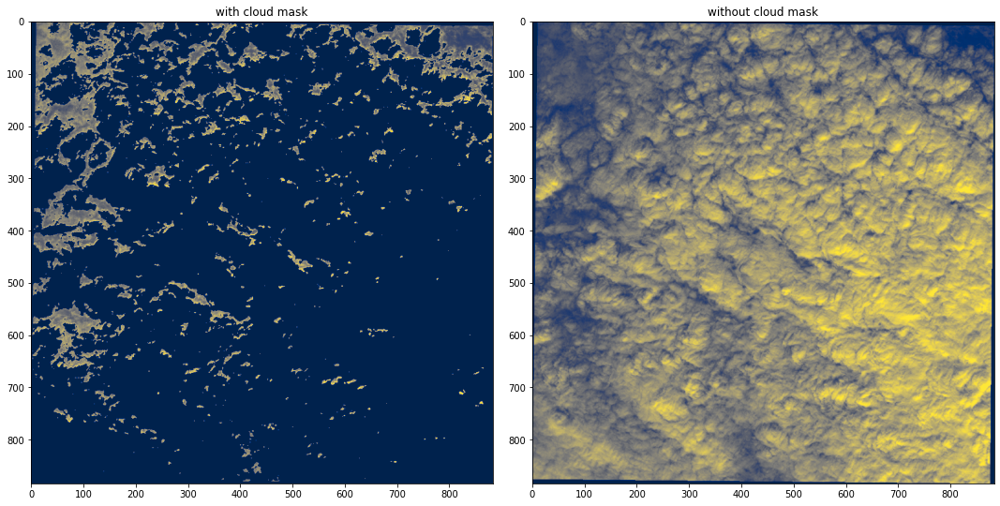

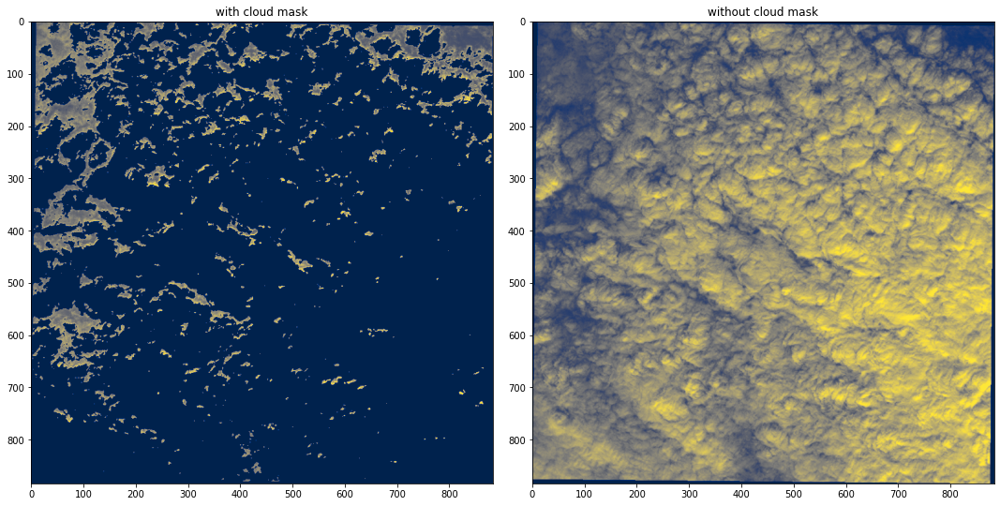

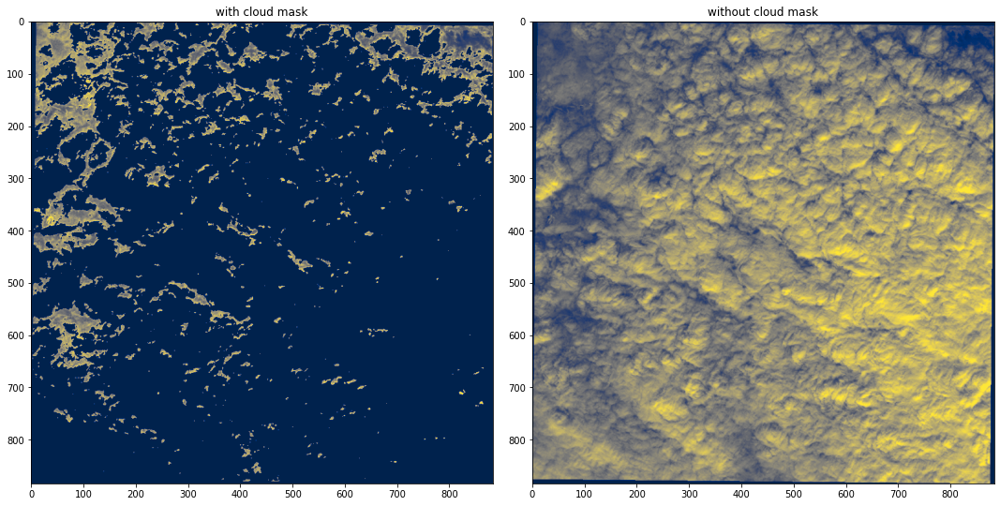

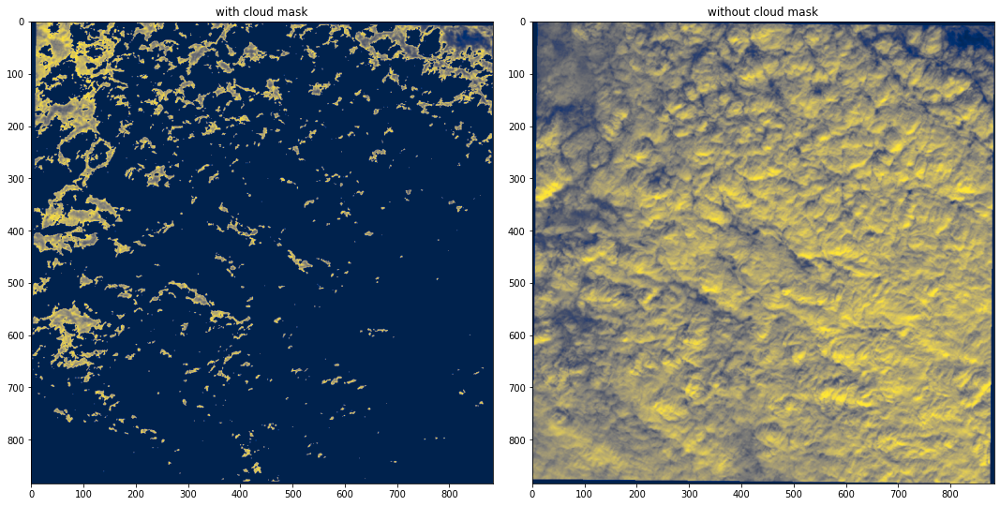

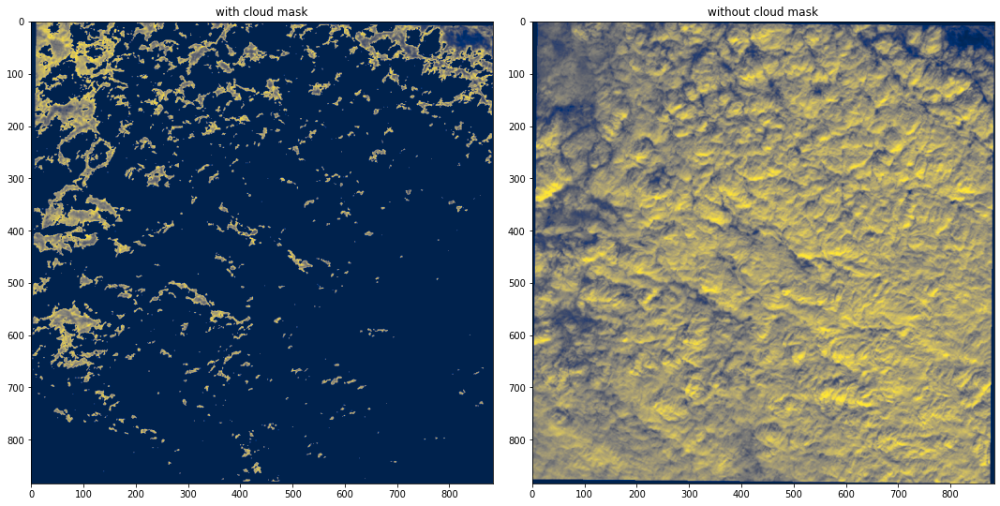

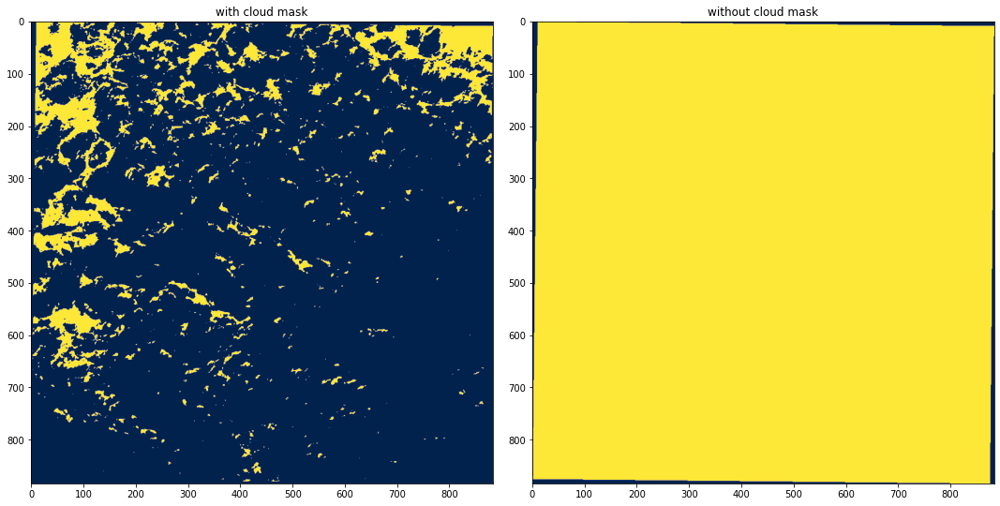

In [ ]:

def sliding_window(image, stepSize, windowSize):
  '''
  Computes sliding window across image

  INPUTS:

  image : (array) image being windowed
  stepSize : (int) value in which the window moves horizontally after one window
  windowSize : (tuple) size of window

  OUTPUTS:

  set of windows across image
  '''
  for y in range(0, image.shape[0], stepSize):
    for x in range(0, image.shape[1], stepSize):
      yield [x, y, image[y:y + windowSize[1], x:x + windowSize[0]]]

def extractFeatures(window):
  '''
  extract features from window

  INPUTS:

  window: (array) : window containing positions and values

  OUTPUTS:

  features ((x,y),value)
  '''
  return (window[0], window[1]), window[2]

#computing 4x4 window across image and getting features

def full_feature_creation(picture_num_used, stepSize = 4, windowSize = (4,4)):
  feature_lookup = []
  orig_image = show_image(picture_num_used, band = 4)

  #getting the 7 band from image num
  
  features = np.zeros((len(orig_image)**2,7,windowSize[0],windowSize[1]))

  #using 7 bands

  for band_idx,band in enumerate([0,1,2,3,4,5,6]):
    orig_image = show_image(picture_num_used, band = band)
    windows = sliding_window(orig_image, stepSize, windowSize)
    for idx, window in enumerate(windows):
      point, featureVector = extractFeatures(window)
      feature_lookup.append(point)
      features[idx,band_idx] = np.array(featureVector)



In [ ]:
(4,4)[1]

4

In [ ]:
''' finding the range of values for each respective band '''

#creating array of dataset bands (in hindsight it may have been easier to use a column index)

dataset_bands = features[:,2]
band_distribution = []

#separating each band

for i in range(len(dataset_bands)):
  band_distribution.append([dataset_bands[i][j] for j in range(4)])
band_distribution = np.array(band_distribution)

In [ ]:
values, counts = np.unique(features, return_counts=True)

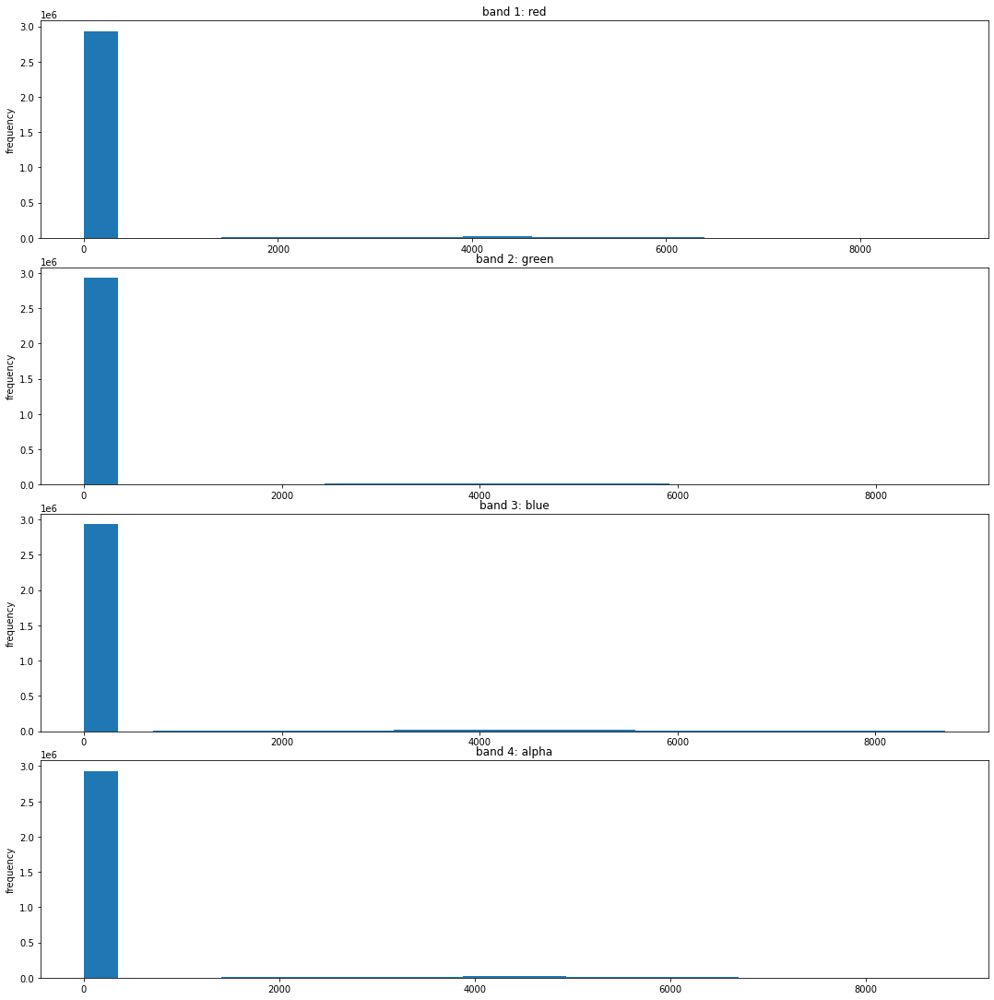

In [ ]:
'''creating histogram of values of images picked from toy dataset'''

fig, axs = plt.subplots(4,1)

fig.set_figheight(15)
fig.set_figwidth(15)
fig.tight_layout()
bands = {0:'red',1:'green',2:'blue', 3:'alpha'}
for i in range(4):
  
  axs[i].hist(band_distribution[:,i].flatten().squeeze(),bins=25)
  
  axs[i].set_title("band " + str(i+1) + ": " + bands[i]) 
  axs[i].set_ylabel('frequency')

In [ ]:
np.save('/content/drive/MyDrive/toy_dataset', features)